# ECG Anomaly Detection

## Introduction and Business Problem

Doctors are in short supply worldwide.  Some areas, such as in central Africa and western and central Asia, have less than 1 medical doctor per 1,000 people (2018 data from the World Bank.)  [Medic Mobile](https://medic.org/) has contracted my company to research and develop a viable model that can identify and tag anomalous electrocardiographs from a dataset that contains normal and abnormal ECGs.  Medic Mobile is a nonprofit organization that strives to improve health care for those living in hard-to-reach communities.  Medic Mobile now impacts 14 countries in Africa and Asia, having trained and equipped 24,463 health workers.

### Imports

In [365]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam
from pylab import rcParams
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow import keras
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style="darkgrid", palette='muted', font_scale=1.2)
whimsy_pallette = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(whimsy_pallette))
rcParams['figure.figsize'] = 12, 8

### The Dataset

From [timeseriesclassification.com...](http://www.timeseriesclassification.com/description.php?Dataset=ECG5000) The original dataset for "ECG5000" is a 20-hour long ECG downloaded from Physionet. The name is BIDMC Congestive Heart Failure Database(chfdb) and it is record "chf07". It was originally published in "Goldberger AL, Amaral LAN, Glass L, Hausdorff JM, Ivanov PCh, Mark RG, Mietus JE, Moody GB, Peng C-K, Stanley HE. PhysioBank, PhysioToolkit, and PhysioNet: Components of a New Research Resource for Complex Physiologic Signals. Circulation 101(23)". The data was pre-processed in two steps: (1) extract each heartbeat, (2) make each heartbeat equal length using interpolation. This dataset was originally used in paper "A general framework for never-ending learning from time series streams", DAMI 29(6). After that, 5,000 heartbeats were randomly selected. The patient has severe congestive heart failure and the class values were obtained by automated annotation. The dataset is stationary.

In [366]:
data_path = 'data/ecg.csv'
df = pd.read_csv(data_path, header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,131,132,133,134,135,136,137,138,139,140
0,-0.112522,-2.827204,-3.773897,-4.349751,-4.376041,-3.474986,-2.181408,-1.818286,-1.250522,-0.477492,...,0.792168,0.933541,0.796958,0.578621,0.257740,0.228077,0.123431,0.925286,0.193137,1.0
1,-1.100878,-3.996840,-4.285843,-4.506579,-4.022377,-3.234368,-1.566126,-0.992258,-0.754680,0.042321,...,0.538356,0.656881,0.787490,0.724046,0.555784,0.476333,0.773820,1.119621,-1.436250,1.0
2,-0.567088,-2.593450,-3.874230,-4.584095,-4.187449,-3.151462,-1.742940,-1.490659,-1.183580,-0.394229,...,0.886073,0.531452,0.311377,-0.021919,-0.713683,-0.532197,0.321097,0.904227,-0.421797,1.0
3,0.490473,-1.914407,-3.616364,-4.318823,-4.268016,-3.881110,-2.993280,-1.671131,-1.333884,-0.965629,...,0.350816,0.499111,0.600345,0.842069,0.952074,0.990133,1.086798,1.403011,-0.383564,1.0
4,0.800232,-0.874252,-2.384761,-3.973292,-4.338224,-3.802422,-2.534510,-1.783423,-1.594450,-0.753199,...,1.148884,0.958434,1.059025,1.371682,1.277392,0.960304,0.971020,1.614392,1.421456,1.0


You can see by scrolling to the last column that it contains the labels - 0 is an anomalous heartbeat, 1 is a normal heartbeat.

In [367]:
df.shape

(4998, 141)

In [368]:
df[140].value_counts()

1.0    2919
0.0    2079
Name: 140, dtype: int64

### Drop target from data; create target df with labels

In [369]:
raw_data = df.values

# The last element contains the labels
target = raw_data[:, -1]

# The other data points are the electrocadriogram data
features = raw_data[:, 0:-1]

### Train Test Split

In [370]:
x_train, x_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=21,
)

### Scale the input as tensor arrays

In [371]:
min_val = tf.reduce_min(x_train)
max_val = tf.reduce_max(x_train)

x_train = (x_train - min_val) / (max_val - min_val)
x_test = (x_test - min_val) / (max_val - min_val)

x_train = tf.cast(x_train, tf.float32)
x_test = tf.cast(x_test, tf.float32)

### Separate the normal and anomalous ECGs

In [372]:
y_train = y_train.astype(bool)
y_test = y_test.astype(bool)

x_norm_train = x_train[y_train]
x_norm_test = x_test[y_test]

x_abnorm_train = x_train[~y_train]
x_abnorm_test = x_test[~y_test]

### Plot a normal ECG and abnormal ECG

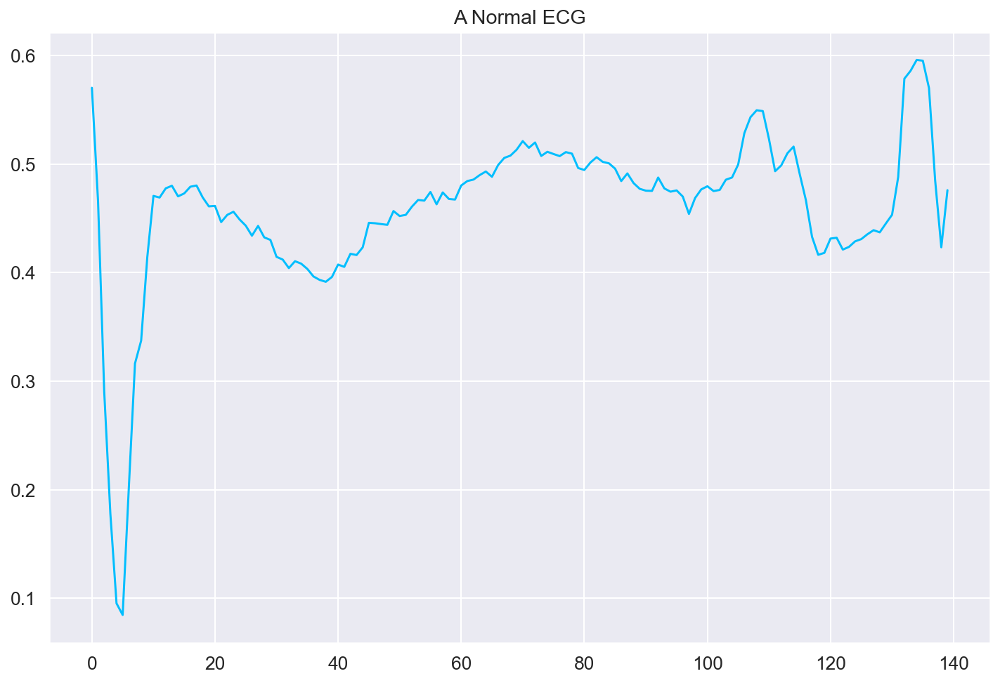

In [373]:
# 1st ECG in the normal set
plt.plot(np.arange(140), x_norm_train[0])
plt.title("A Normal ECG")
plt.savefig('images/normal_ecg.png', dpi=300, pad_inches=0.1,)
plt.show()

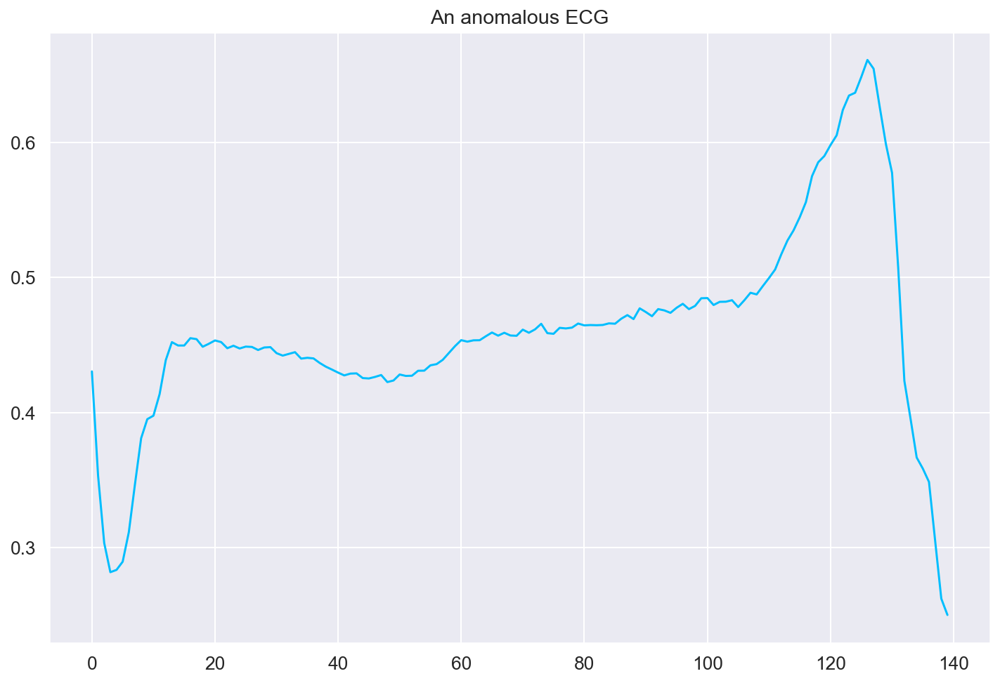

In [374]:
# 1st ECG in the abnormal set
plt.plot(np.arange(140), x_abnorm_train[0])
plt.title("An anomalous ECG")
plt.savefig('images/anomalous_ecg.png', dpi=300, pad_inches=0.1,)
plt.show()

## What is an autoencoder?
    
An autoencoder is an unsupervised artificial neural network that attempts to encode the data by compressing it into lower dimensions and the decode the data to reconstruct the original input.  The idea is that the reconstructed data would be as close as possible to the original.  The compressed representation of the input data is called the bottleneck layer.  The number of hidden units in the code is called the code size.  It has several used, one of which is for our purpose, anomaly detection.  Here's a simple diagram:

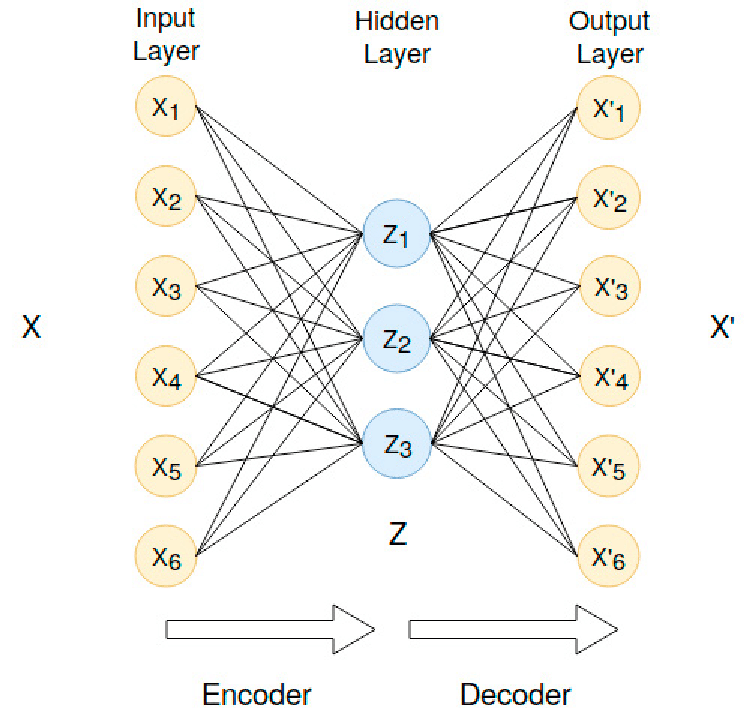



The code size, which is the size of the bottleneck, is the most important hyperperameter.  A small bottleneck lowers the risk of overfittings, but if it's too small,there is an increased chance of important information slipping out through the pooling layers of the encoder.

Autoencoding is essentially a non-linear version of Principal Component Analysis (PCA).  In fact, if you don't define any activations, and set the cost function to mean squared error (MSE), the autoencoder ends up performing PCA.  The initial model below does exactly this:

## Base Model - PCA using an Neural Network Autoencoder

In [525]:
encoder = Sequential([
      Dense(3),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(3),     
      Dense(x_norm_train.shape[1])
    ])

In [526]:
autoencoder = keras.models.Sequential([encoder, decoder])
autoencoder.compile(loss='mse', optimizer='adam')

In [527]:
history = autoencoder.fit(
    x_norm_train,
    x_norm_train,
    epochs=15,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/15
5/5 [==============================] - 0s 24ms/step - loss: 0.2158 - val_loss: 0.2077
Epoch 2/15
5/5 [==============================] - 0s 5ms/step - loss: 0.2054 - val_loss: 0.2007
Epoch 3/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1976 - val_loss: 0.1911
Epoch 4/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1878 - val_loss: 0.1808
Epoch 5/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1773 - val_loss: 0.1695
Epoch 6/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1657 - val_loss: 0.1573
Epoch 7/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1535 - val_loss: 0.1447
Epoch 8/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1407 - val_loss: 0.1317
Epoch 9/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1277 - val_loss: 0.1190
Epoch 10/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1150 - val_loss: 0.1066
Epoch 11/15
5/5 [=====================

In [528]:
autoencoder.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_11 (Sequential)  (None, 2)                 431       
                                                                 
 sequential_12 (Sequential)  (None, 140)               569       
                                                                 
Total params: 1,000
Trainable params: 1,000
Non-trainable params: 0
_________________________________________________________________


### Training vs. Validation loss per epoch

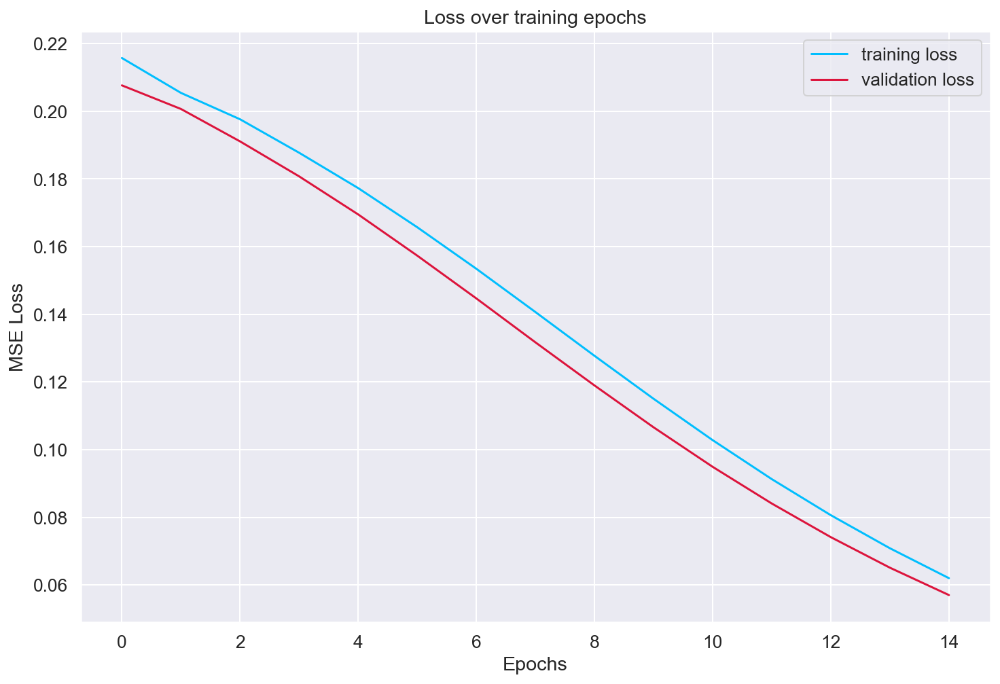

In [529]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

In [530]:
def plot_ecg(title, df, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(0,10):
        x = np.random.randint(low=0, high=(len(df)-1))
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

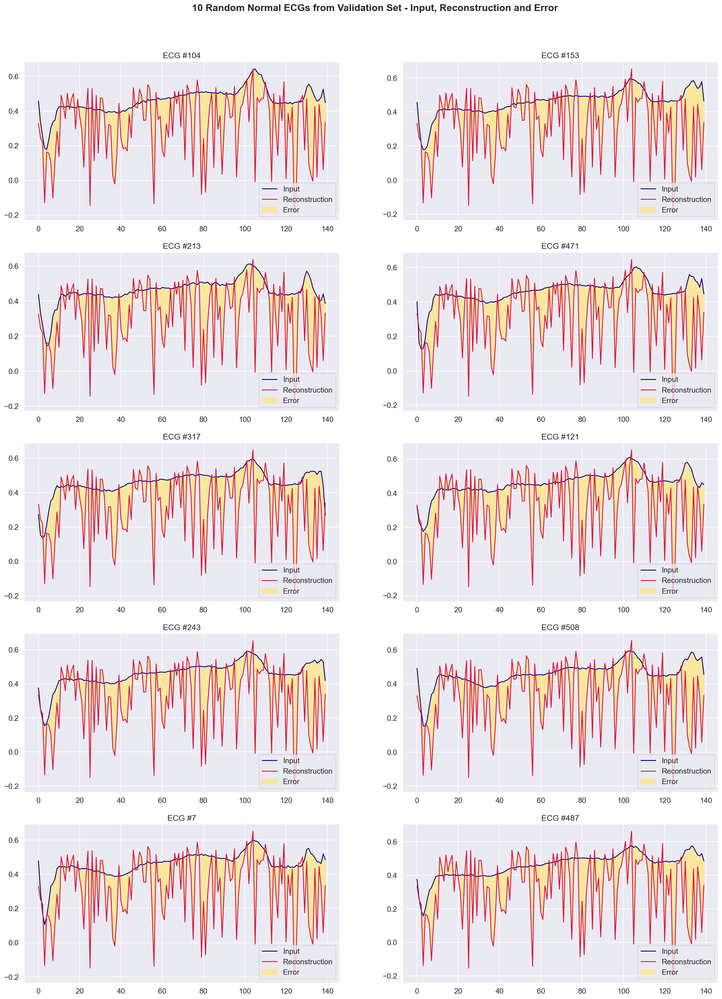

In [531]:
plot_ecg('10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/pca_model_1_norm_in_out.png')

### Input vs Reconstruction for an Abnormal ECG

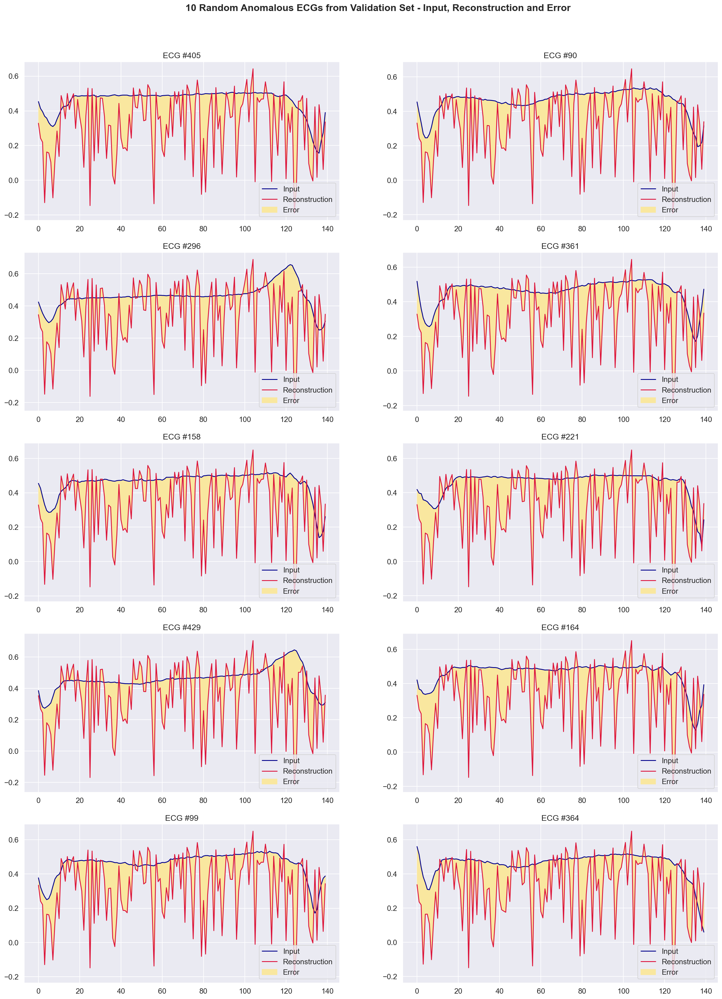

In [532]:
plot_ecg('10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/pca_model_1_abnorm_in_out.png')

### Finding anomalous ECGs

We are calculating the mean squared error from examples from the normal training set, and then classifying as anomalous examples from the test set where the reconstruction error is 1 standard deviation from the training set.

#### Functions needed

In [533]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mse(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mse(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

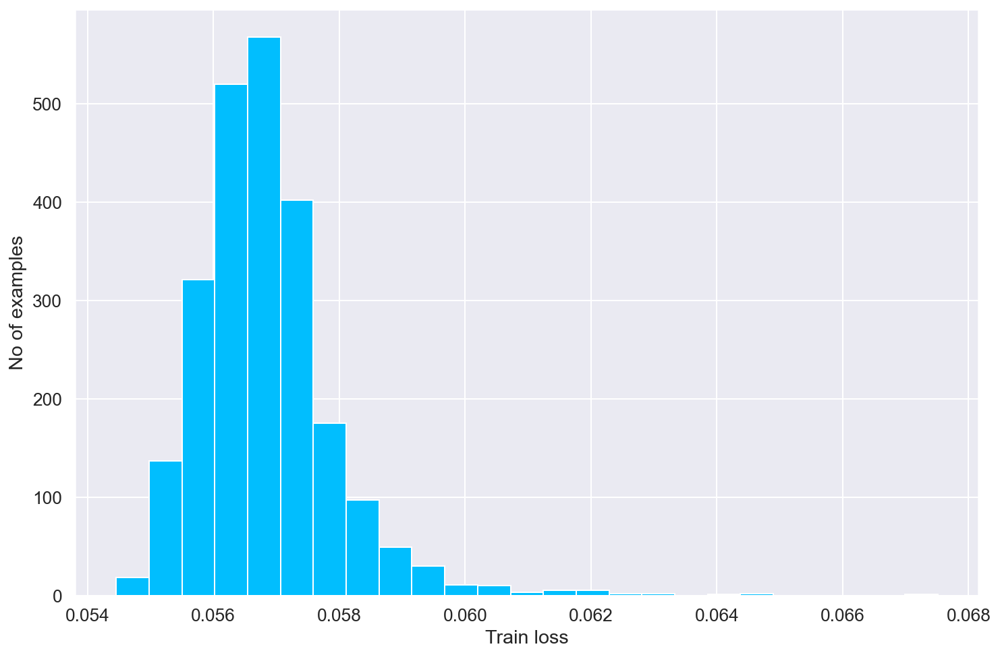

In [534]:
reconstructions = autoencoder.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

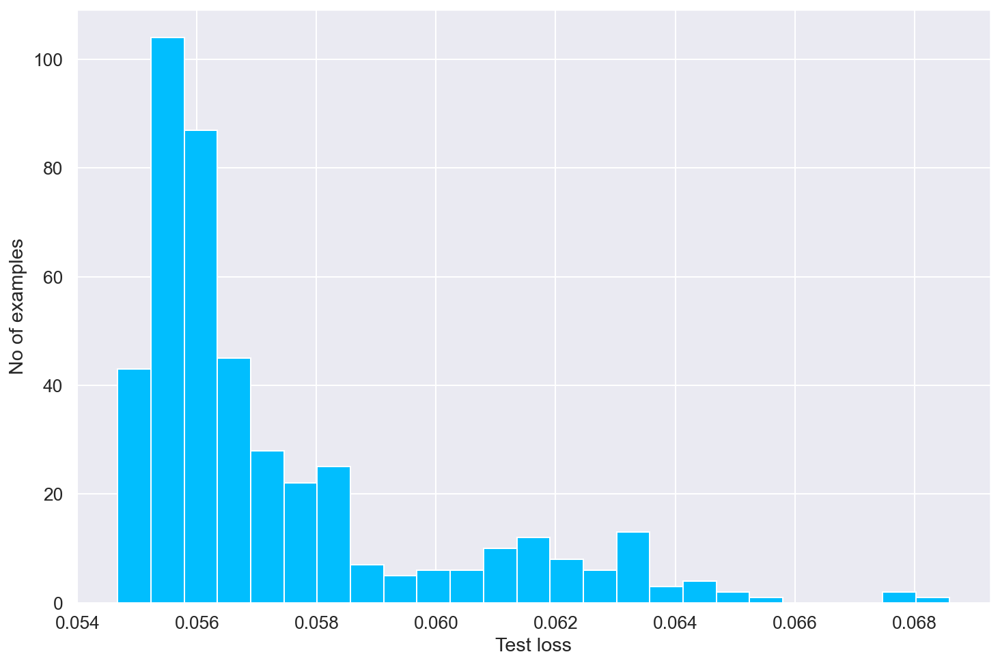

In [535]:
reconstructions = autoencoder.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

#### Calculating threshold and getting preditions

In [536]:
threshold = find_threshold(autoencoder, x_norm_train)
preds = get_predictions(autoencoder, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.057919349521398544


#### Calculate F1 score and Area Under the Curve (AUC)

In [537]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

Code adapted from [machine learning mastery](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/).

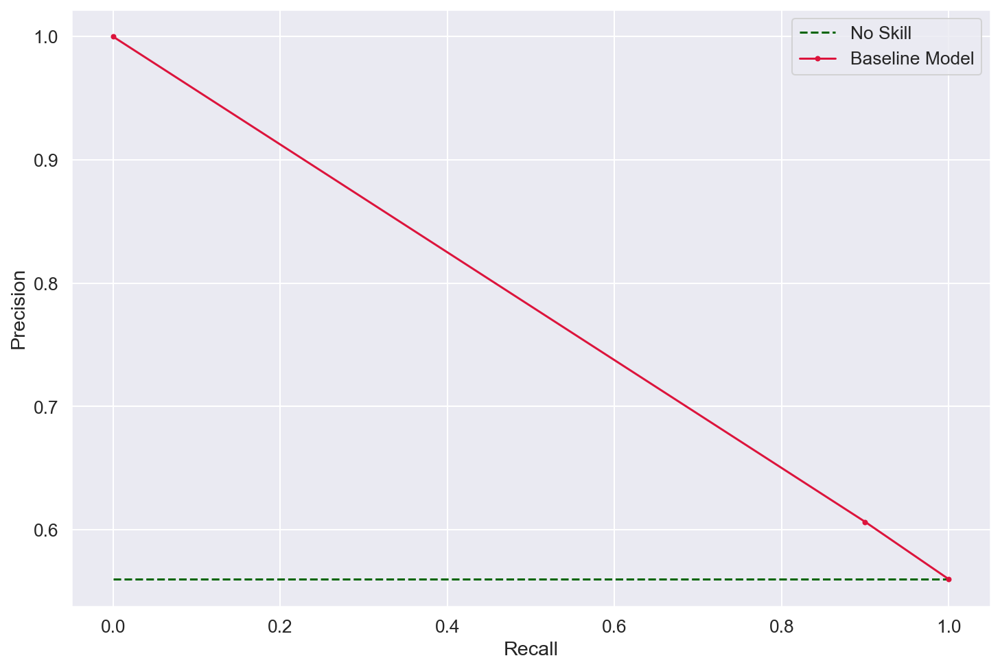

In [538]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Baseline Model')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();

In [539]:
# summarize scores
print('Autoencoder - PCA scores:')
print('F1 score: %.3f' % (f1))
print('AUC score: %.3f' % (auc))
print_stats(preds, y_test)

Autoencoder - PCA scores:
F1 score: 0.725
AUC score: 0.781
Accuracy = 0.617
Precision = 0.6064981949458483
Recall = 0.9


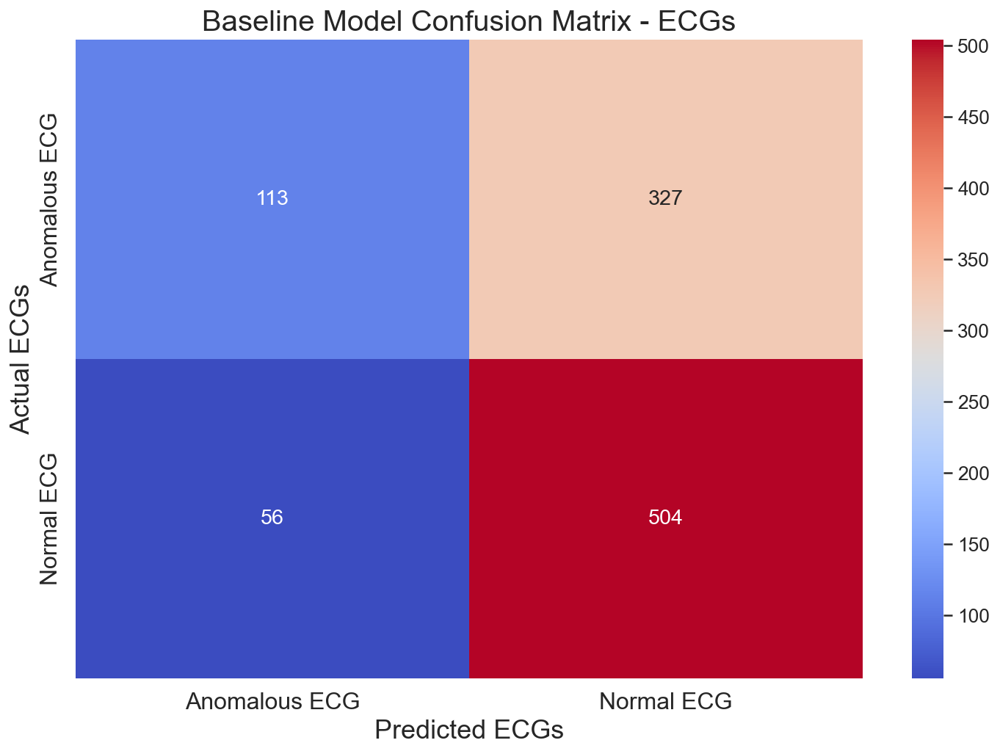

In [540]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Baseline Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This is pretty bad.  Predicting a heart condition requires far greater accuracy.  We want to lean into the top right hand corner of the confusion matrix - this cell tells us the ECGs we predicted as normal, but they are really anomalous.  Since we don't want to tell people their heart is normal when it's really not, we want to reduce this number as much as possible, even at the expense of telling people they might have a heart condition when they really do not.  That's the number in the bottom left box.

Before we leave PCA, let's take one more shot with some adjusted parameters.  

## PCA using an Autoencoder - Take 2

The changes we'll make is to adjust the first layer of both the encoder and decoder to 8 inputs.  We'll leave the bottleneck at 2 inputs.  We'll also increase the number of ephochs from 15 to 20.

In [460]:
encoder = Sequential([
      Dense(8),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(8),     
      Dense(x_norm_train.shape[1])
    ])

In [461]:
pca_model_2 = keras.models.Sequential([encoder, decoder])
pca_model_2.compile(loss='mse', optimizer='adam')

In [462]:
history = pca_model_2.fit(
    x_norm_train,
    x_norm_train,
    epochs=20,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/20
5/5 [==============================] - 0s 22ms/step - loss: 0.2327 - val_loss: 0.2132
Epoch 2/20
5/5 [==============================] - 0s 5ms/step - loss: 0.2116 - val_loss: 0.2056
Epoch 3/20
5/5 [==============================] - 0s 5ms/step - loss: 0.2031 - val_loss: 0.1982
Epoch 4/20
5/5 [==============================] - 0s 5ms/step - loss: 0.1950 - val_loss: 0.1881
Epoch 5/20
5/5 [==============================] - 0s 8ms/step - loss: 0.1821 - val_loss: 0.1716
Epoch 6/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1656 - val_loss: 0.1539
Epoch 7/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1474 - val_loss: 0.1345
Epoch 8/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1275 - val_loss: 0.1149
Epoch 9/20
5/5 [==============================] - 0s 7ms/step - loss: 0.1076 - val_loss: 0.0955
Epoch 10/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0887 - val_loss: 0.0777
Epoch 11/20
5/5 [=====================

In [463]:
pca_model_2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_5 (Sequential)   (None, 2)                 1146      
                                                                 
 sequential_6 (Sequential)   (None, 140)               1284      
                                                                 
Total params: 2,430
Trainable params: 2,430
Non-trainable params: 0
_________________________________________________________________


### Training vs. Validation loss per epoch

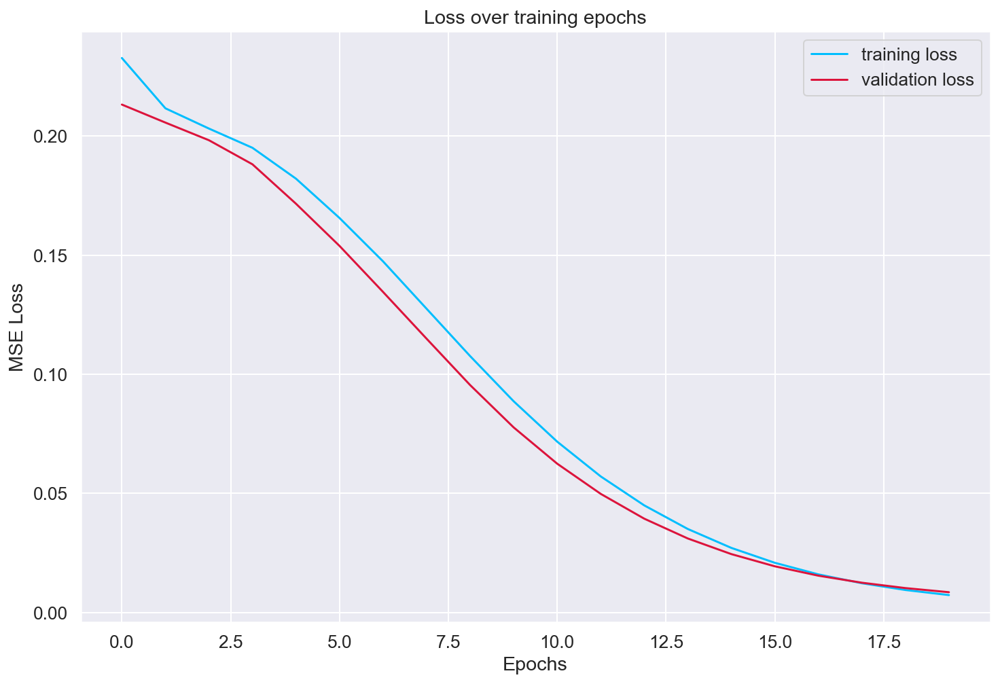

In [464]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

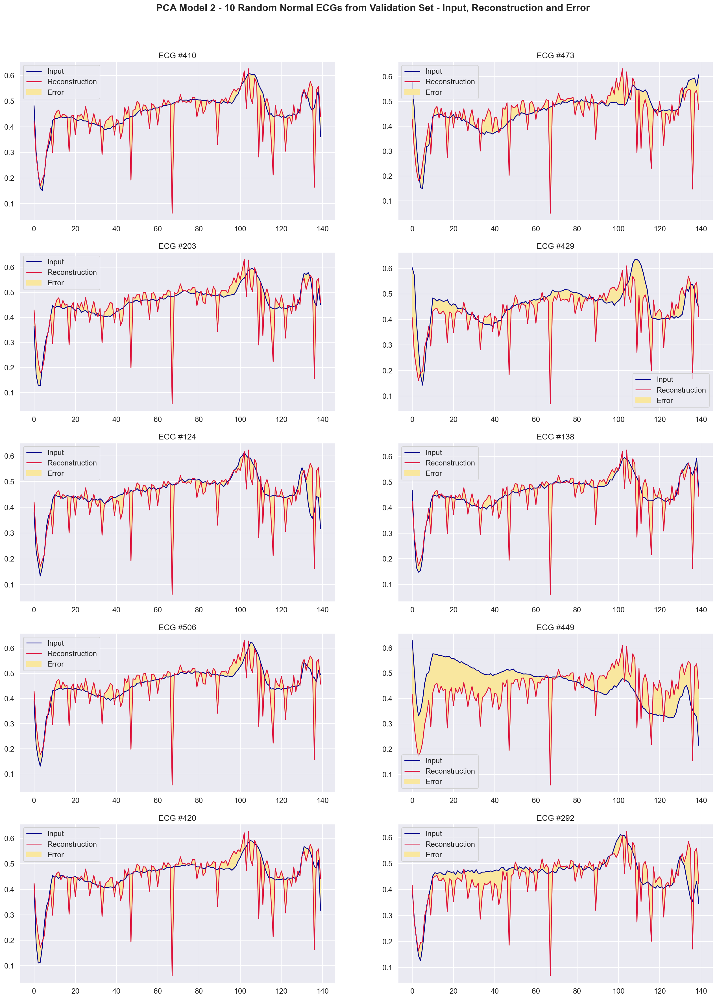

In [465]:
plot_ecg('PCA Model 2 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/pca_model_2_norm_in_out.png')

### Input vs Reconstruction for an Abnormal ECG

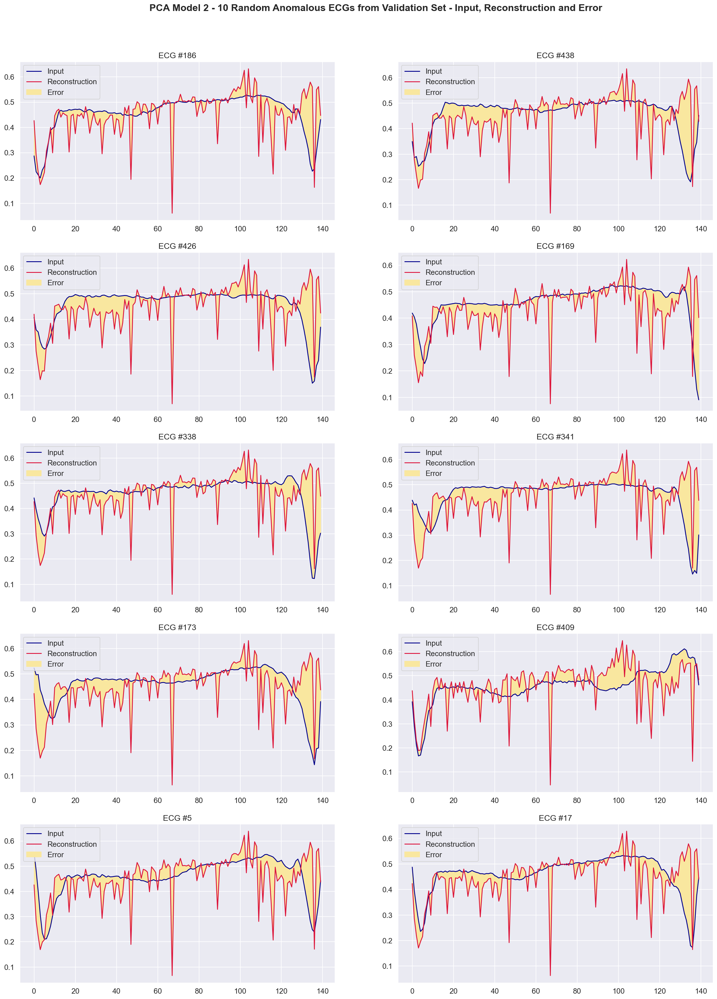

In [466]:
plot_ecg('PCA Model 2 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/pca_model_2_abnorm_in_out.png')

### Finding anomalous ECGs

Same calculations as the first model

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

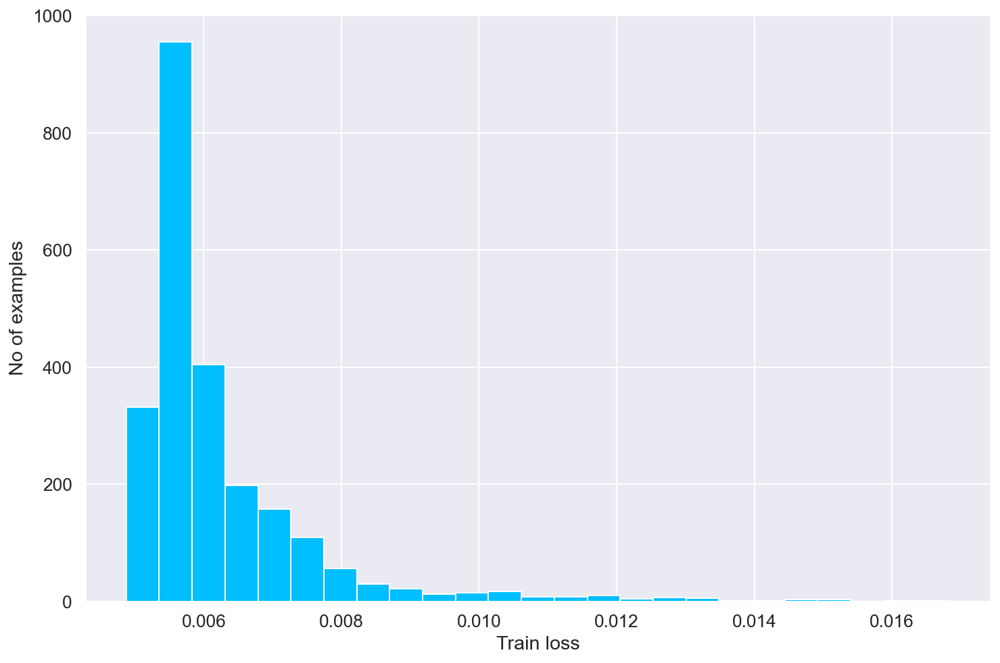

In [467]:
reconstructions = pca_model_2.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

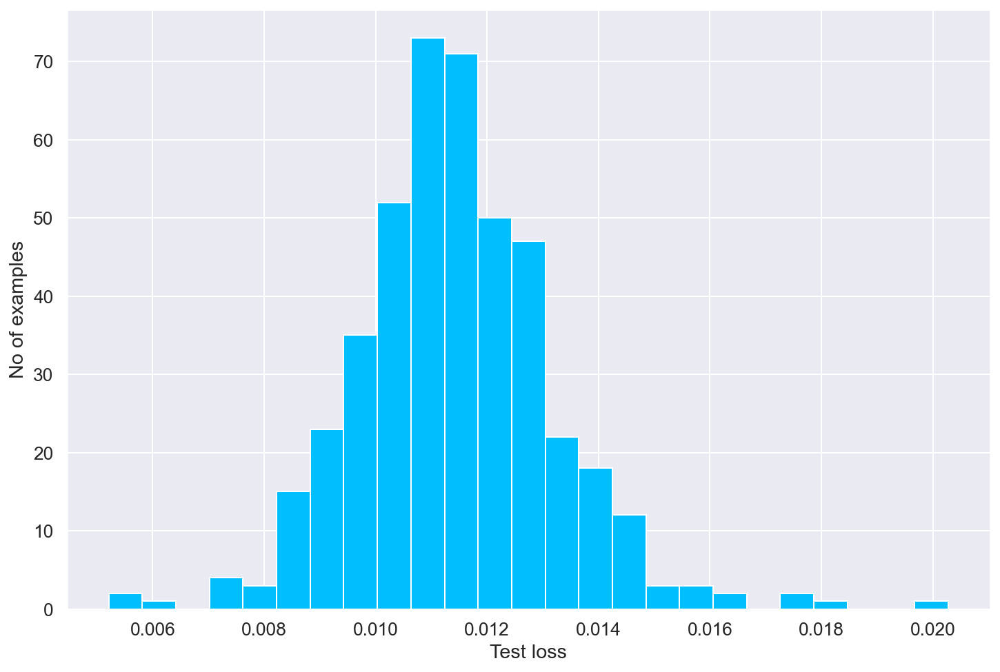

In [468]:
reconstructions = pca_model_2.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [469]:
threshold = find_threshold(pca_model_2, x_norm_train)
preds = get_predictions(pca_model_2, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.007578776217997074


#### Calculate F1 score and Area Under the Curve (AUC)

In [470]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

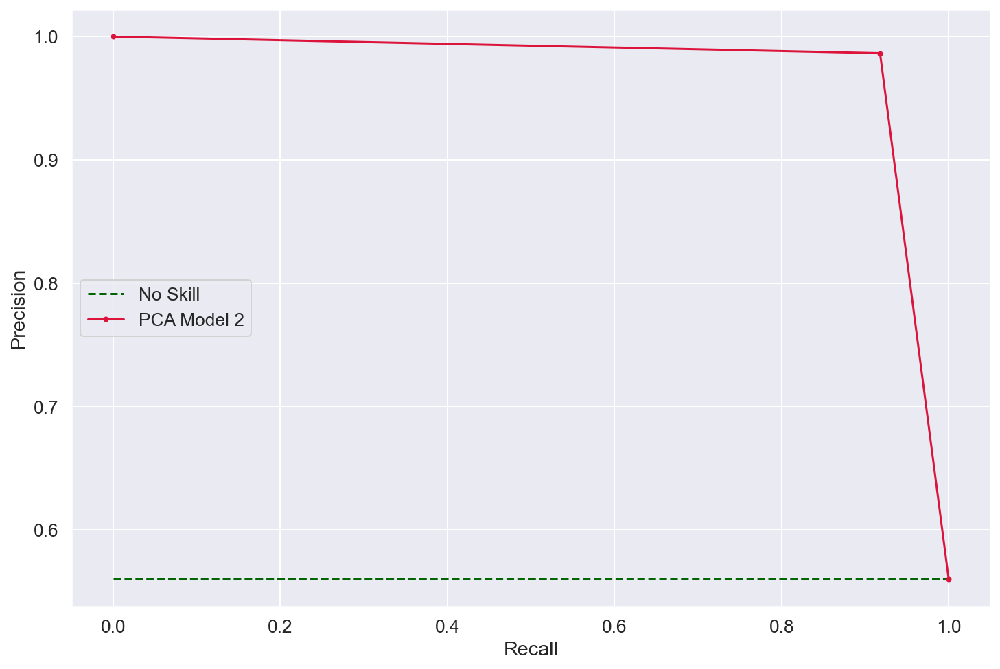

In [471]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='PCA Model 2')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();

In [472]:
# summarize scores
print('PCA Model 2 Scores:')
print('F1 score: %.3f' % (f1))
print('AUC score: %.3f' % (auc))
print_stats(preds, y_test)

PCA Model 2 Scores:
F1 score: 0.951
AUC score: 0.975
Accuracy = 0.947
Precision = 0.9865642994241842
Recall = 0.9178571428571428


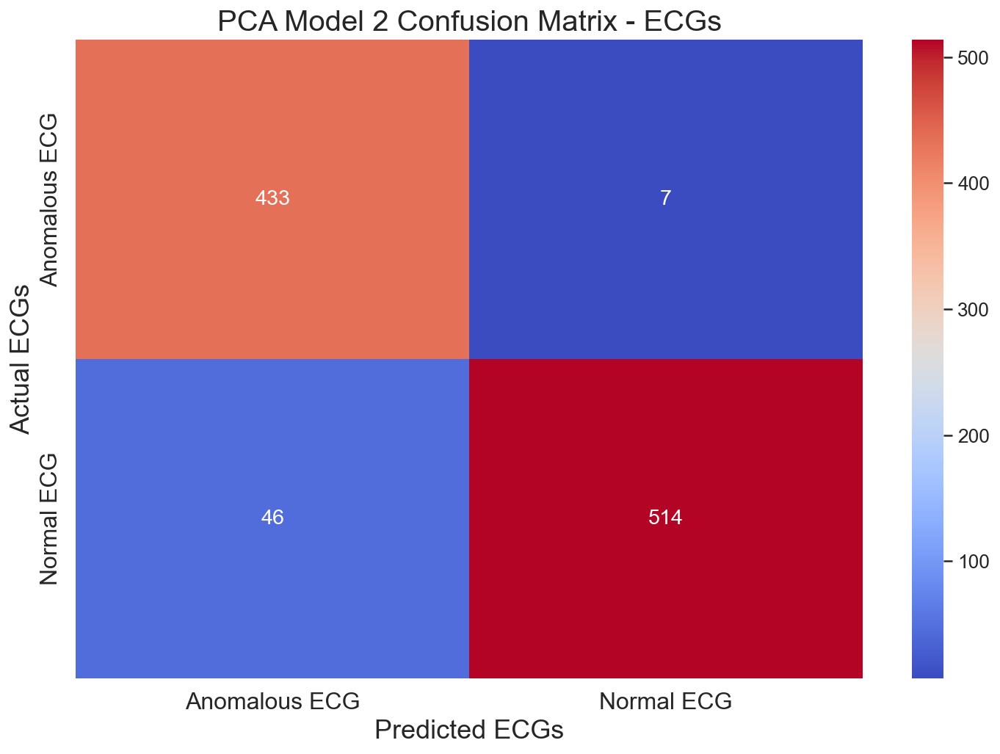

In [473]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('PCA Model 2 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_2_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

The reconstructions on the training data leave a lot to be desired, which means our residuals are still quite high. We need the model to fit the reconstructions better to the original training data before we can trust the results, so let's move on to something different.  We'll leave the PCA model with it's linear activations and move to a more true version of an autoencoder, with non-linear activations.

## Non-Linear Neural Network

In [405]:
encoder = tf.keras.Sequential([
      Dense(64, activation='relu'),
      Dropout(0.1),
      Dense(32, activation='relu'),
      Dropout(0.1),
      Dense(16, activation='relu'),
      Dropout(0.1),
      Dense(4, activation='relu')
    ])   

In [406]:
decoder = tf.keras.Sequential([
      layers.Dense(16, activation="relu"),
      layers.Dense(32, activation="relu"),
      layers.Dense(140, activation="sigmoid")])

In [407]:
seq_model_1 = Sequential([encoder, decoder])

In [408]:
seq_model_1.compile(loss='mae', optimizer='adam')

In [409]:
history = seq_model_1.fit(
    x_norm_train,
    x_norm_train,
    epochs=100,
    batch_size=512,
    shuffle=True,
    validation_data=(x_test, x_test)
)

Epoch 1/100
5/5 [==============================] - 1s 26ms/step - loss: 0.0578 - val_loss: 0.0534
Epoch 2/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0559 - val_loss: 0.0522
Epoch 3/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0531 - val_loss: 0.0509
Epoch 4/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0497 - val_loss: 0.0485
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0458 - val_loss: 0.0459
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0418 - val_loss: 0.0437
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0383 - val_loss: 0.0419
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0356 - val_loss: 0.0406
Epoch 9/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0333 - val_loss: 0.0395
Epoch 10/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0312 - val_loss: 0.0384
Epoch 11/100
5/5 [==========

In [410]:
seq_model_1.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_8 (Sequential)   (None, 4)                 11700     
                                                                 
 sequential_9 (Sequential)   (None, 140)               5244      
                                                                 
Total params: 16,944
Trainable params: 16,944
Non-trainable params: 0
_________________________________________________________________


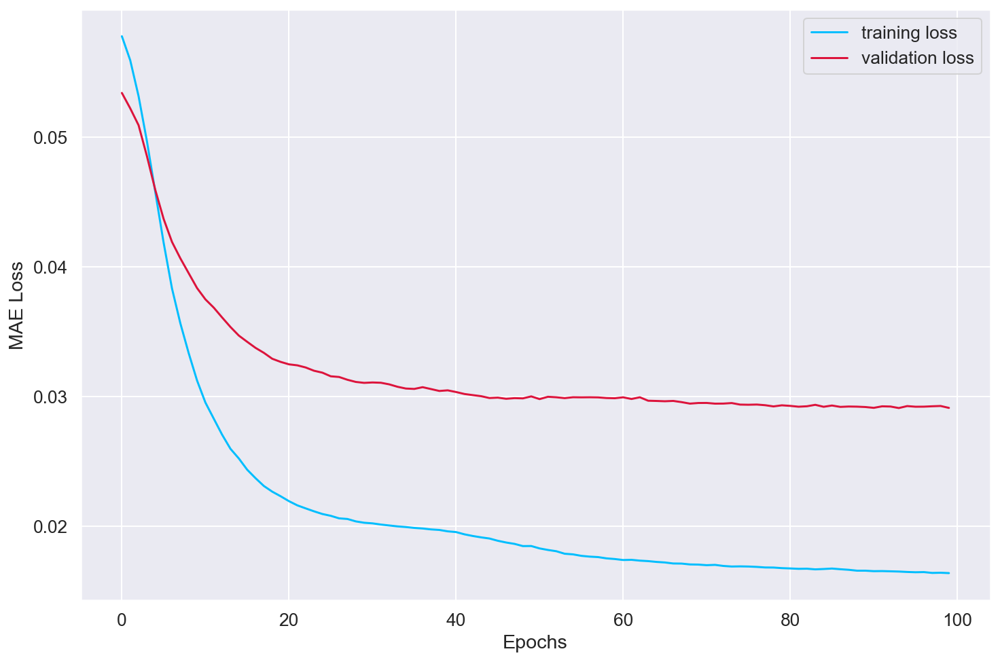

In [411]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

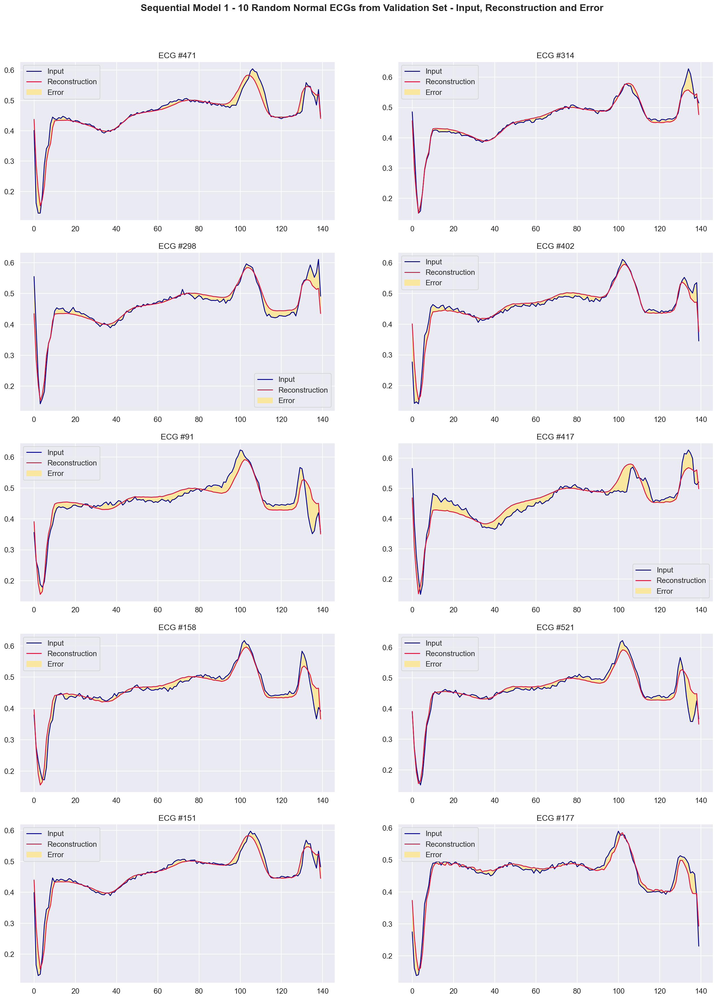

In [412]:
plot_ecg('Sequential Model 1 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/seq_model_1_norm_in_out.png')

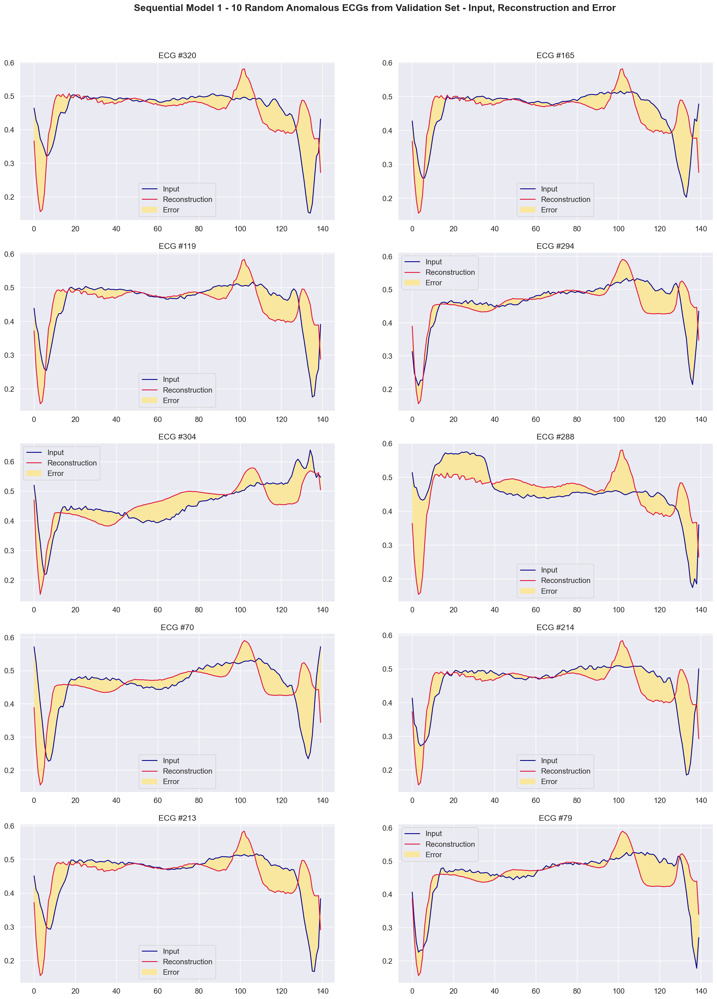

In [413]:
plot_ecg('Sequential Model 1 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/seq_model_1_abnorm_in_out.png')

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

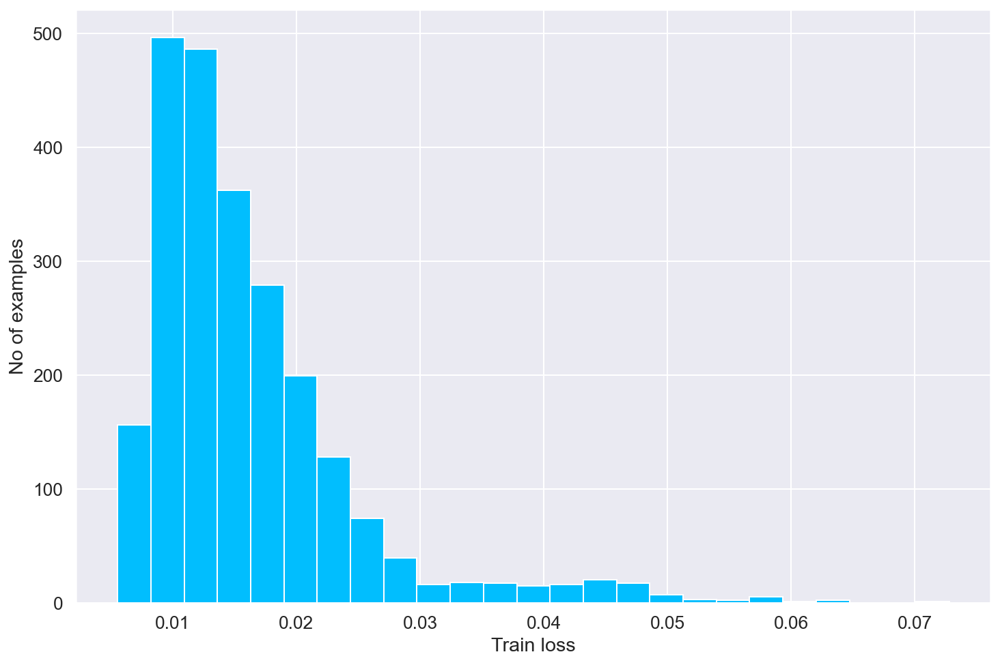

In [414]:
reconstructions = seq_model_1.predict(x_norm_train)
train_loss = tf.keras.losses.mae(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

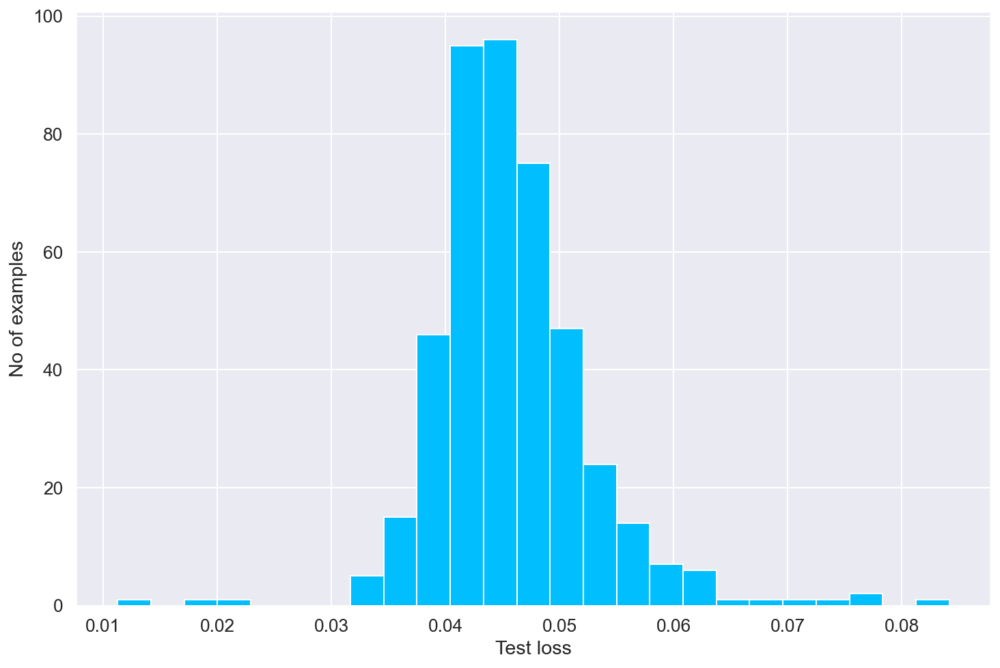

In [415]:
reconstructions = seq_model_1.predict(x_abnorm_test)
test_loss = tf.keras.losses.mae(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

#### New functions - calculating loss using Mean Absolute Error (MAE)

In [416]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mae(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mae(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [417]:
threshold = find_threshold(seq_model_1, x_norm_train)
preds = get_predictions(seq_model_1, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.024480674415826797


#### Calculate F1 score and Area Under the Curve (AUC)

In [418]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

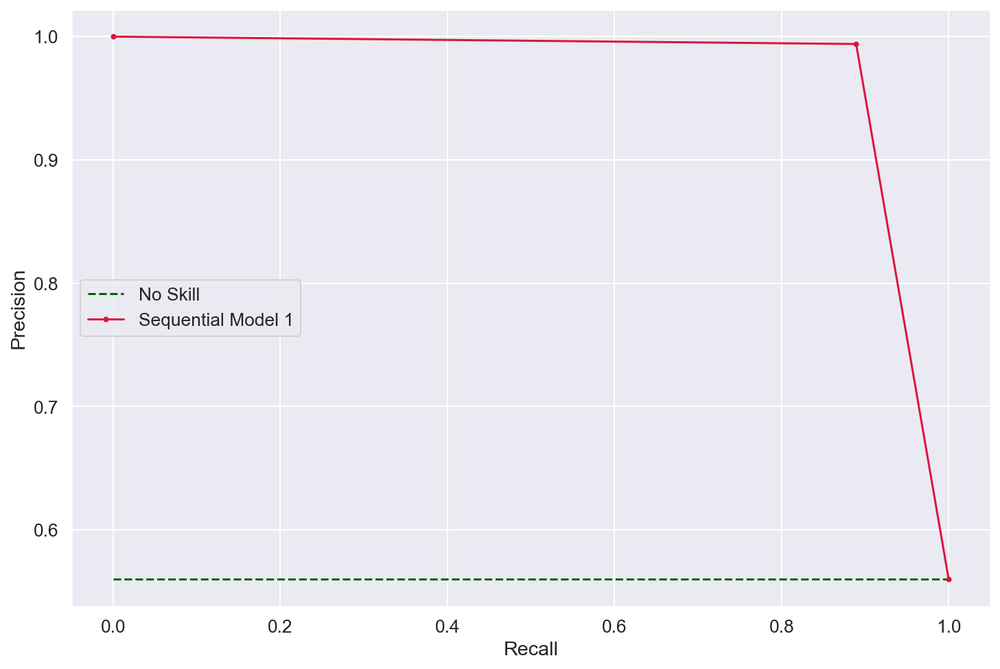

In [419]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Sequential Model 1')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();

In [420]:
# summarize scores
print('Sequential Model 1 Scores:')
print('F1 score: %.3f' % (f1))
print('AUC score: %.3f' % (auc))
print_stats(preds, y_test)

Sequential Model 1 Scores:
F1 score: 0.939
AUC score: 0.973
Accuracy = 0.935
Precision = 0.9940119760479041
Recall = 0.8892857142857142


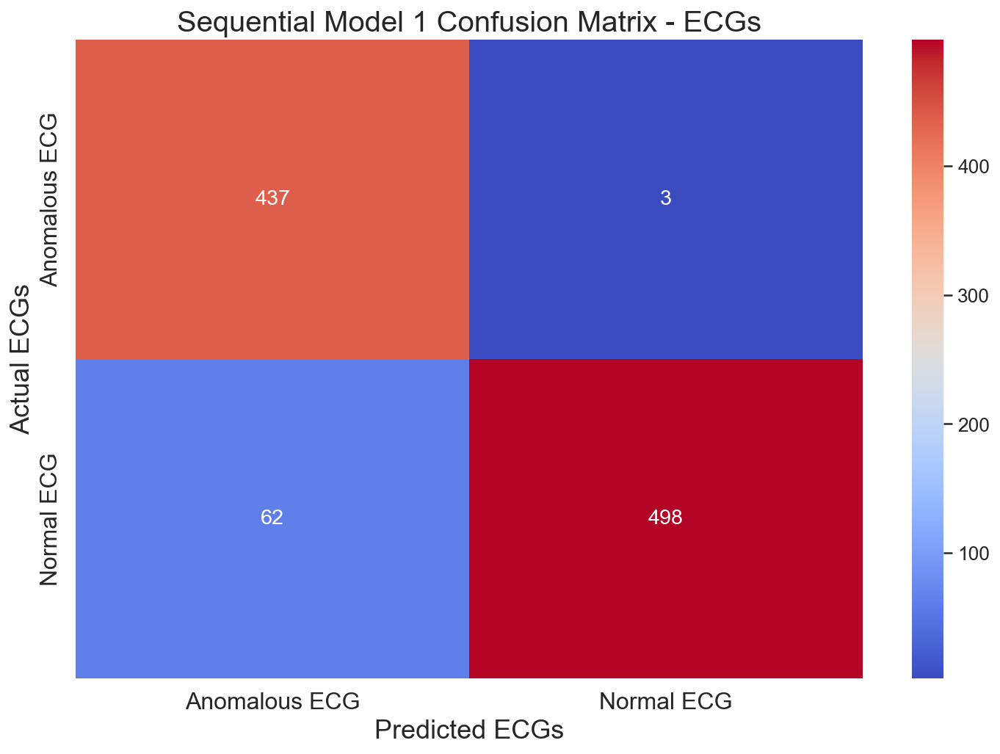

In [421]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Sequential Model 1 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/seq_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This is progress - we're definitely doing well in minimizing the misidentified anomalous ECGs.  But, we'd like to see the number in the bottom left of the matrix go down, also.  Below is a function that will look for our best parameters for this model and store our results in a dictionary.  Let see how it does.

### Searching for the best model using Keras Tuner

Keras tuner code adapted from [analyticvidhya.com](https://www.analyticsvidhya.com/blog/2021/05/anomaly-detection-using-autoencoders-a-walk-through-in-python/)

The tuner will use 4 layers each for the encoder and decoder, with a code size of 8 for the bottleneck. It will iterate through input / output values from 16 - 72 in increments of 4, and through learning rates of .01, .001, and .0001.  Loss will be calculated as Mean Absolute Error, and Adam will be the optimizer, as in the previous model.  The results are stored, and the best model hyperparameters will be retrieved to compile and fit the model below.

In [422]:
import keras_tuner as kt

class AutoEncoderTuner(Model):

  def __init__(self, hp, output_units, code_size=8):
    super().__init__()
    dense_1_units = hp.Int('dense_1_units', min_value=16, max_value=72, step=4)
    dense_2_units = hp.Int('dense_2_units', min_value=16, max_value=72, step=4)
    dense_3_units = hp.Int('dense_3_units', min_value=16, max_value=72, step=4)
    dense_4_units = hp.Int('dense_4_units', min_value=16, max_value=72, step=4)
    dense_5_units = hp.Int('dense_5_units', min_value=16, max_value=72, step=4)
    dense_6_units = hp.Int('dense_6_units', min_value=16, max_value=72, step=4)
    
    self.encoder = Sequential([
      Dense(dense_1_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_2_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_3_units, activation='relu'),
      Dropout(0.1),
      Dense(code_size, activation='relu')
    ])
    self.decoder = Sequential([
      Dense(dense_4_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_5_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_6_units, activation='relu'),
      Dropout(0.1),
      Dense(output_units, activation='sigmoid')
    ])
  
  def call(self, inputs):
    encoded = self.encoder(inputs)
    decoded = self.decoder(encoded)
    return decoded


def build_model(hp):
  model = AutoEncoderTuner(hp, 140)
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(
      loss='mae',
      optimizer=Adam(learning_rate=hp_learning_rate),
  )
  return model

In [423]:
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=20,
    factor=4,
    directory='autoencoder',
    project_name='tuning_autoencoder6'
)

tuner.search(
    x_norm_train, 
    x_norm_train, 
    epochs=100, 
    batch_size=512,
    validation_data=(x_norm_test, x_norm_test)
)

INFO:tensorflow:Reloading Oracle from existing project autoencoder/tuning_autoencoder6/oracle.json
INFO:tensorflow:Reloading Tuner from autoencoder/tuning_autoencoder6/tuner0.json
INFO:tensorflow:Oracle triggered exit


In [424]:
hparams = [f'dense_{i}_units' for i in range(1,7)] + ['learning_rate']
best_hyperparams = tuner.get_best_hyperparameters()
for hps in hparams:
  print(f"{hps}: {best_hyperparams[0][hps]}")

dense_1_units: 28
dense_2_units: 64
dense_3_units: 60
dense_4_units: 56
dense_5_units: 32
dense_6_units: 60
learning_rate: 0.01


In [425]:
best_model = tuner.get_best_models()[0]
best_model.compile(loss='mae', optimizer=Adam(0.001))

best_model.fit(
    x_norm_train,
    x_norm_train,
    epochs=100,
    batch_size=512,
    validation_data=(x_test, x_test))

Epoch 1/100
5/5 [==============================] - 1s 29ms/step - loss: 0.0198 - val_loss: 0.0323
Epoch 2/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0196 - val_loss: 0.0321
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0195 - val_loss: 0.0319
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0194 - val_loss: 0.0318
Epoch 5/100
5/5 [==============================] - 0s 9ms/step - loss: 0.0194 - val_loss: 0.0318
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0193 - val_loss: 0.0318
Epoch 7/100
5/5 [==============================] - 0s 9ms/step - loss: 0.0191 - val_loss: 0.0318
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0191 - val_loss: 0.0318
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0190 - val_loss: 0.0317
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0190 - val_loss: 0.0317
Epoch 11/100
5/5 [==========

In [426]:
best_model.summary()

Model: "auto_encoder_tuner"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 8)                 10192     
                                                                 
 sequential_1 (Sequential)   (None, 140)               12848     
                                                                 
Total params: 23,040
Trainable params: 23,040
Non-trainable params: 0
_________________________________________________________________


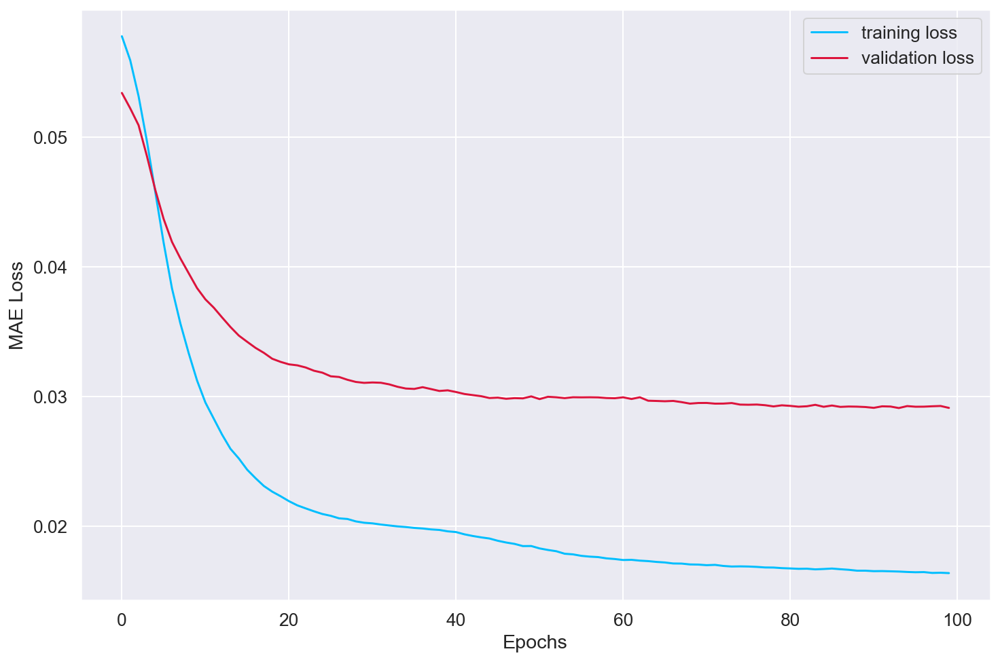

In [427]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

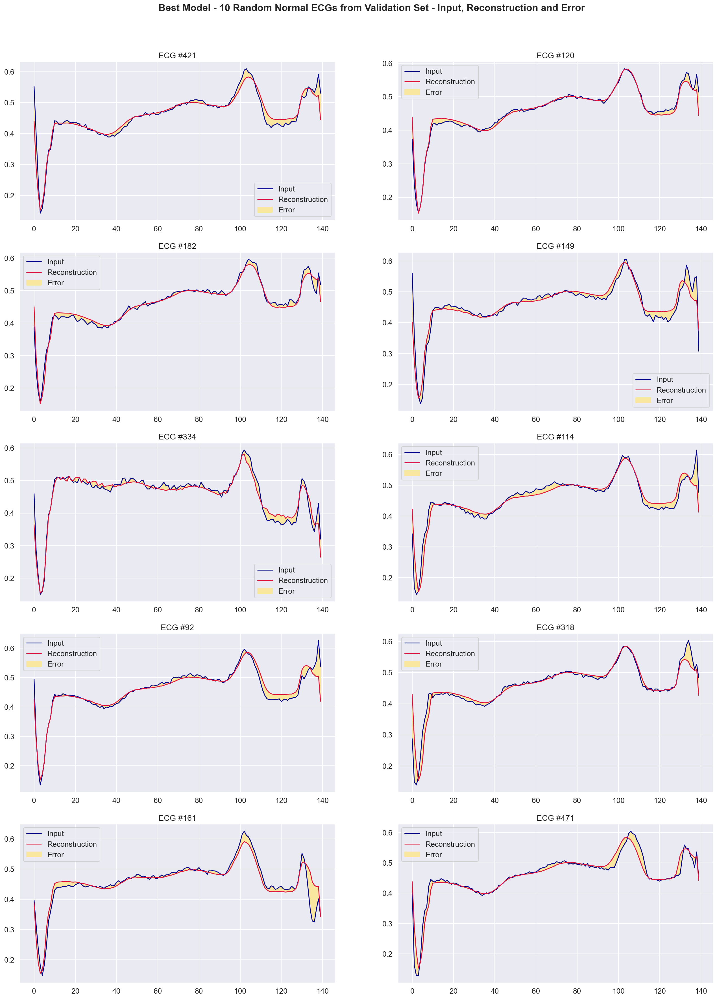

In [428]:
plot_ecg('Best Model - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', x_norm_test, 'images/best_model_norm_in_out.png')

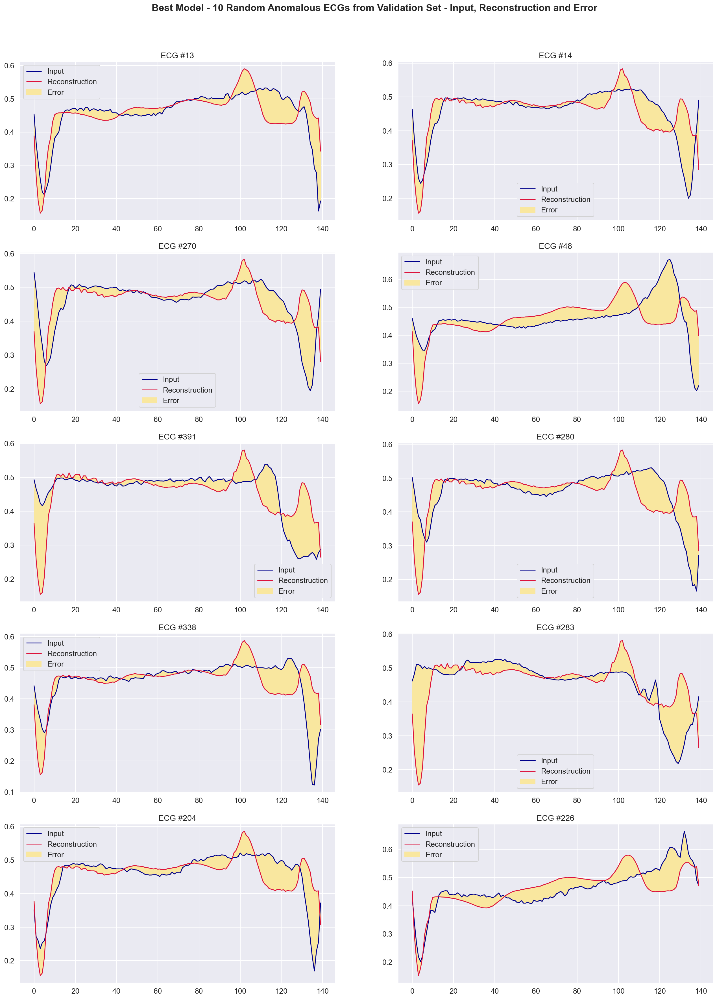

In [429]:
plot_ecg('Best Model - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', x_abnorm_test, 'images/best_model_abnorm_in_out.png')

#### Histograms illustrating the distribution of loss for the normal and anomalous ECGs

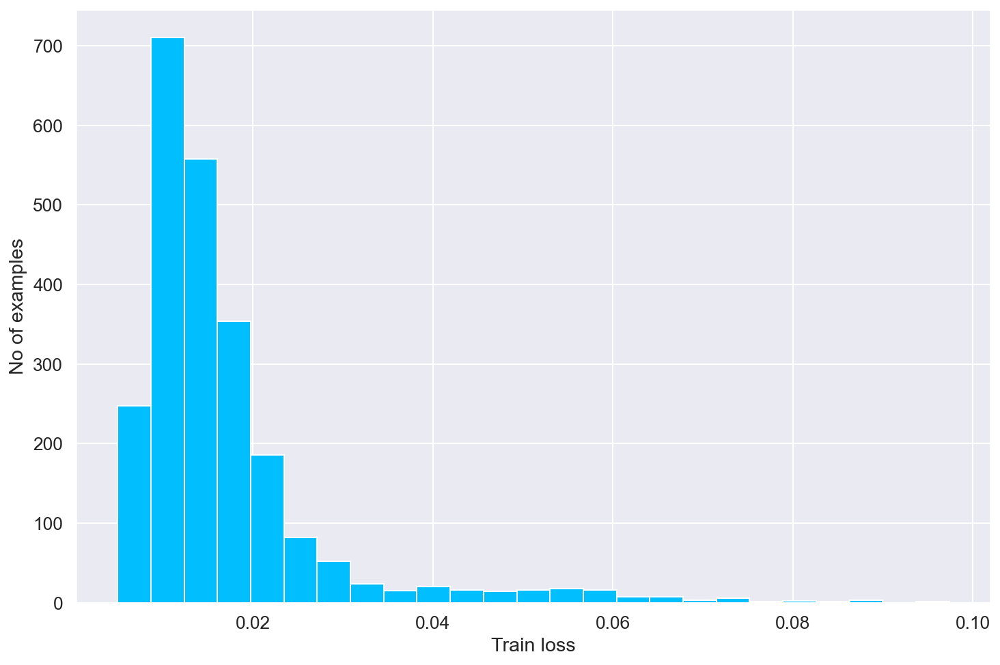

In [430]:
reconstructions = best_model.predict(x_norm_train)
train_loss = tf.keras.losses.mae(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=25)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

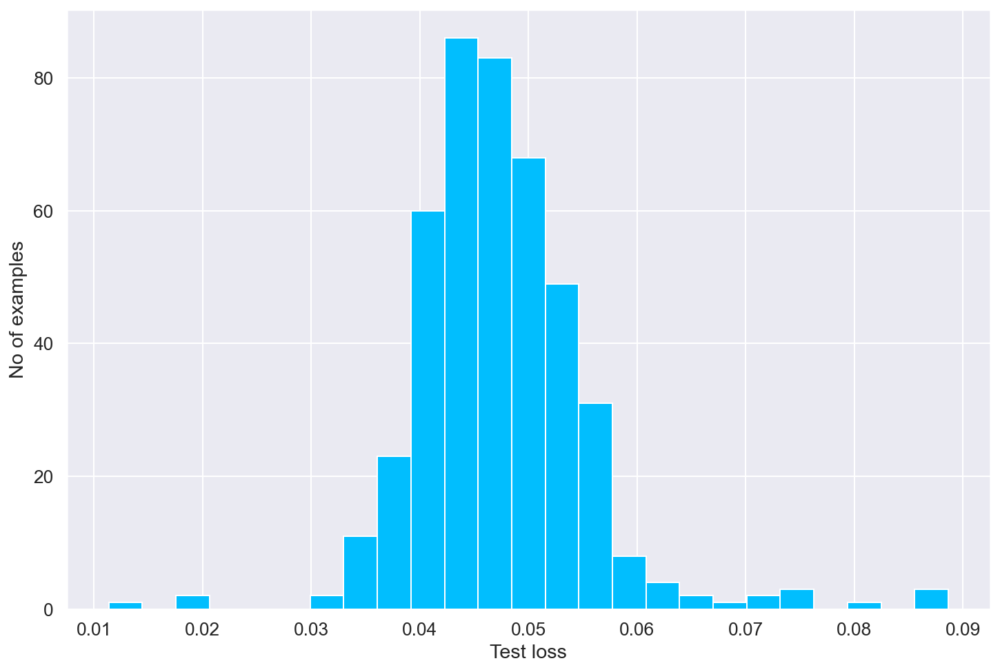

In [431]:
reconstructions = best_model.predict(x_abnorm_test)
test_loss = tf.keras.losses.mae(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=25)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [432]:
threshold = find_threshold(best_model, x_norm_train)
preds = get_predictions(best_model, x_test, threshold)
print(f"Threshold: {threshold}")

Threshold: 0.027853239327669144


#### Calculate F1 score and Area Under the Curve (AUC)

In [433]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

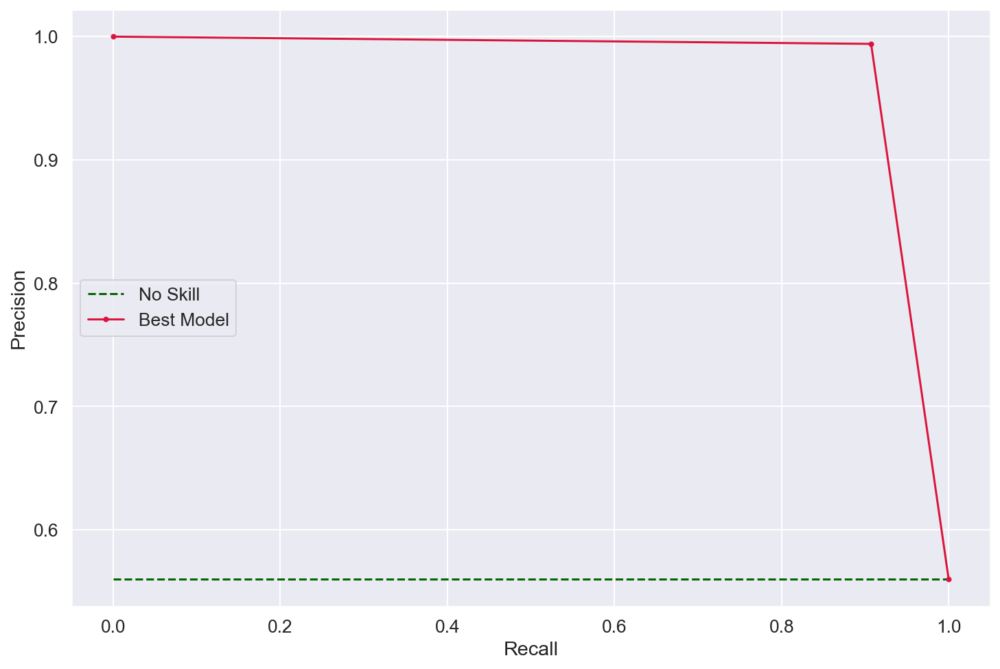

In [434]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Best Model')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();

In [435]:
# summarize scores
print('Best Model Scores:')
print('F1 score: %.3f' % (f1))
print('AUC score: %.3f' % (auc))
print_stats(preds, y_test)

Best Model Scores:
F1 score: 0.949
AUC score: 0.977
Accuracy = 0.945
Precision = 0.9941291585127201
Recall = 0.9071428571428571


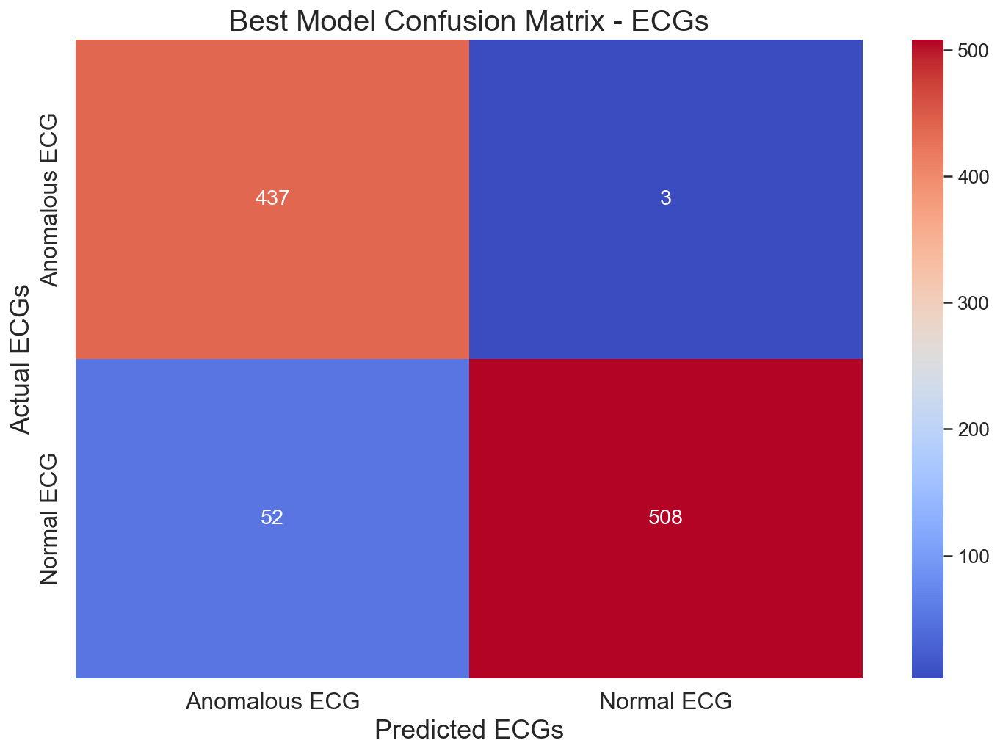

In [436]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Best Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/best_model_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

### A look at False Positives

In [437]:
def idx_fp(y_actual, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0
    fp = []

    for i in range(len(y_pred)):
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           fp.append(i)
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           FN += 1
    return(fp)

def plot_fp(title, df, idx, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(len(idx)):
        x = idx[i]
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

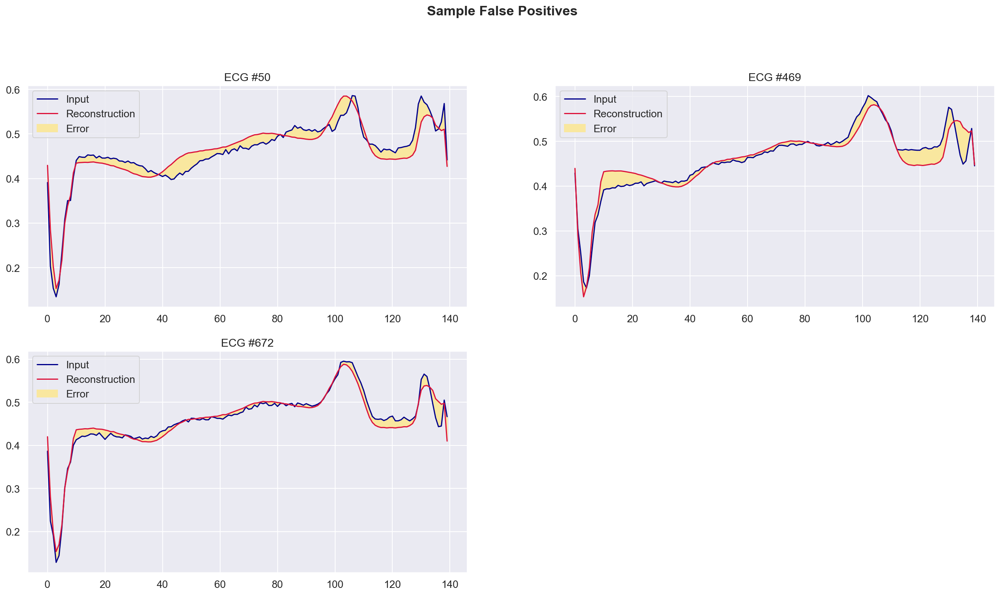

In [438]:
plot_fp("Sample False Positives", x_test, idx_fp(y_test, preds), 'images/sample false positives')

### Same look at False Negatives

In [439]:
def idx_fn(y_actual, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0
    fn = []

    for i in range(len(y_pred)): 
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           fn.append(i)
           FN += 1
    return(fn)

In [440]:
false_neg = idx_fn(y_test,preds)
sample = random.sample(false_neg, 10)

In [441]:
def plot_fn(title, df, idx, save_file_name):
    
    encoded_imgs = encoder(df).numpy()
    decoded_imgs = decoder(encoded_imgs).numpy()
    
    a = 5  # number of rows
    b = 2  # number of columns
    c = 1  # initialize plot counter
    
    fig = plt.figure(figsize=(22,30))
    fig.tight_layout()
    
    for i in range(len(idx)):
        x = idx[i]
        plt.subplot(a, b, c)
        plt.plot(df[x],'darkblue',)
        plt.plot(decoded_imgs[x],'crimson')
        plt.fill_between(np.arange(140), decoded_imgs[x], df[x], color='#F9E79F' )
        plt.title(f'ECG #{x+1}')
        plt.legend(labels=["Input", "Reconstruction", "Error"])
        c = c + 1
    
    plt.suptitle(title, 
             x=(50-(len(title)/4))/100, y=.92, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
    plt.savefig(save_file_name, dpi=300, pad_inches=0.1,)
    plt.show()

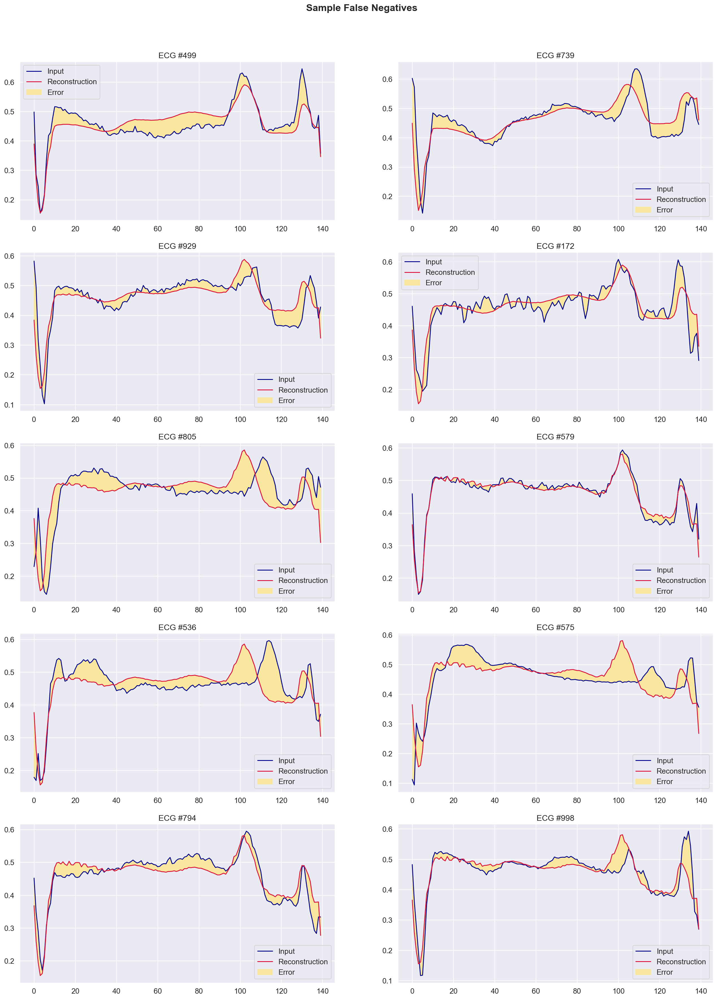

In [442]:
plot_fn("Sample False Negatives", x_test, sample, 'images/sample false negatives')

In [443]:
sample[3]

171

In [541]:
scores = pd.read_csv('data/scores.csv')
scores

,Unnamed: 0,Baseline Model - PCA,Model 2 - PCA,Non-Linear Autoencoder,Best Model
0,Accuracy,61.7,94.7,93.5,94.5
1,Precision,60.6,98.7,99.4,99.4


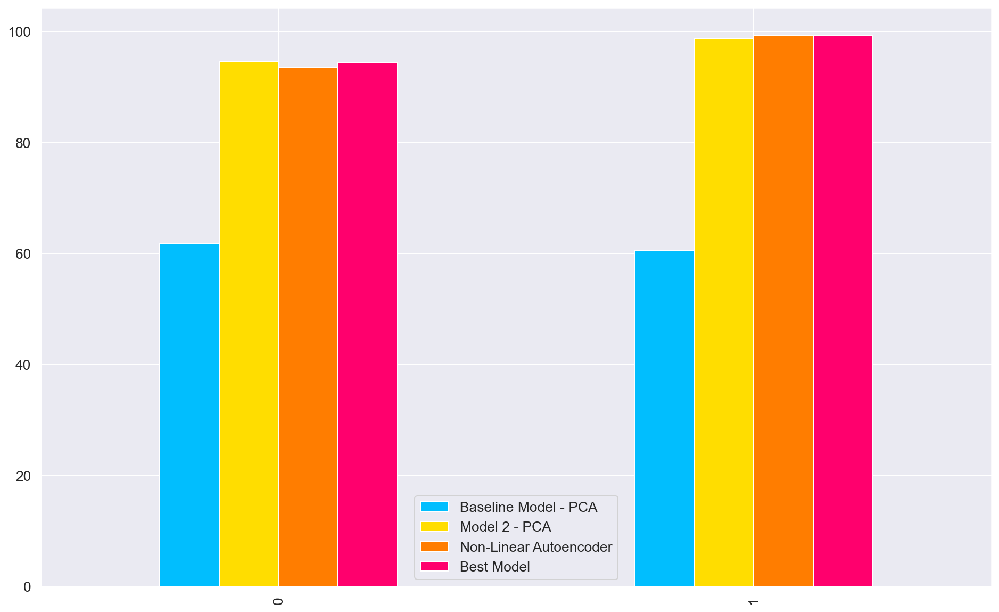

In [542]:
scores.plot(figsize = (16,10), kind='bar', legend=True)
plt.savefig('images/scores.png', dpi=300, pad_inches=0.1,)
plt.show()